<a href="https://colab.research.google.com/github/PyAshishMhatre/DigitalMarketing-Algorithms-Project/blob/main/Exploratory_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install great-expectations
!pip install ydata-profiling

# Importing necessary modules

In [6]:
import pandas as pd 
import numpy as np
import great_expectations as ge
from pandas_profiling import ProfileReport
import seaborn as sns 
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Reading data using great expectations

In [27]:
#Reading data 
distribution_centers = ge.read_csv('distribution_centers.csv')
inventory_items = ge.read_csv('inventory_items.csv')
order_items = ge.read_csv('order_items.csv')
orders = ge.read_csv('orders.csv')
products = ge.read_csv('products.csv')
users = ge.read_csv('users.csv')

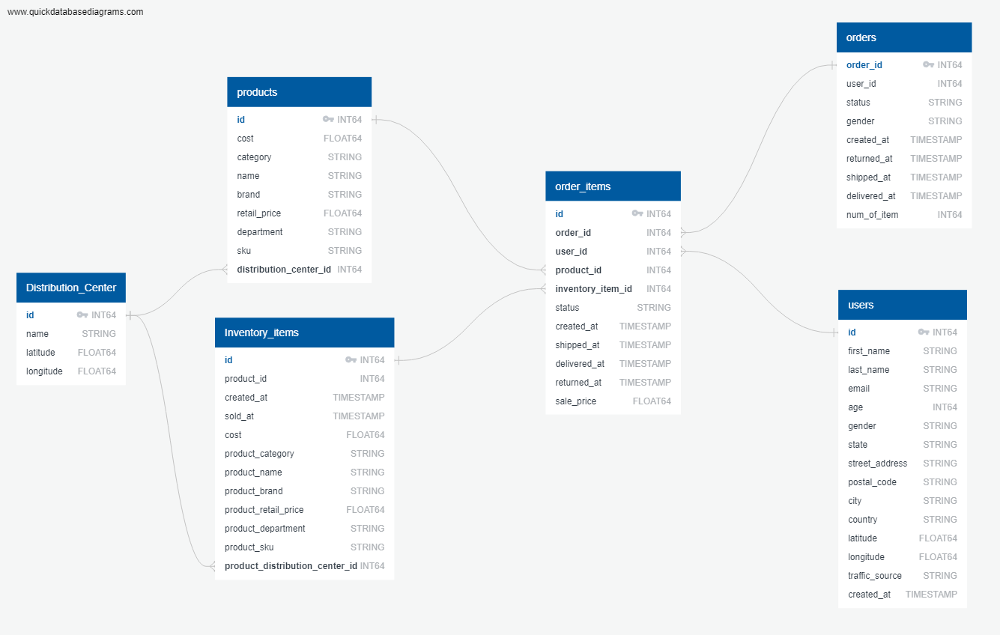

In [28]:
# As distribution center has only 10 centers and all the data looks fine we will omit this df 
# from our data profiling 

distribution_centers

,id,name,latitude,longitude
0,1,Memphis TN,35.1174,-89.9711
1,2,Chicago IL,41.8369,-87.6847
2,3,Houston TX,29.7604,-95.3698
3,4,Los Angeles CA,34.0500,-118.2500
4,5,New Orleans LA,29.9500,-90.0667
5,6,Port Authority of New York/New Jersey NY/NJ,40.6340,-73.7834
6,7,Philadelphia PA,39.9500,-75.1667
7,8,Mobile AL,30.6944,-88.0431
8,9,Charleston SC,32.7833,-79.9333
9,10,Savannah GA,32.0167,-81.1167


In [29]:
inventory_items.head()

,id,product_id,created_at,sold_at,cost,product_category,product_name,product_brand,product_retail_price,product_department,product_sku,product_distribution_center_id
0,55460,16898,2021-07-03 05:36:09 UTC,2021-07-11 09:59:09 UTC,13.925,Tops & Tees,Quiksilver Waterman Men's On The Rise,NaN,25.0,Men,22811EE19846217512507785E74D12CC,3
1,55461,16898,2021-05-06 11:14:00 UTC,NaN,13.925,Tops & Tees,Quiksilver Waterman Men's On The Rise,NaN,25.0,Men,22811EE19846217512507785E74D12CC,3
2,55462,16898,2023-01-29 11:10:00 UTC,NaN,13.925,Tops & Tees,Quiksilver Waterman Men's On The Rise,NaN,25.0,Men,22811EE19846217512507785E74D12CC,3
3,55463,16898,2022-12-17 12:45:00 UTC,NaN,13.925,Tops & Tees,Quiksilver Waterman Men's On The Rise,NaN,25.0,Men,22811EE19846217512507785E74D12CC,3
4,166695,16898,2022-03-19 19:50:35 UTC,2022-03-25 10:41:35 UTC,13.925,Tops & Tees,Quiksilver Waterman Men's On The Rise,NaN,25.0,Men,22811EE19846217512507785E74D12CC,3


In [30]:
order_items.head()

,id,order_id,user_id,product_id,inventory_item_id,status,created_at,shipped_at,delivered_at,returned_at,sale_price
0,82431,56667,45224,13606,222767,Returned,2022-08-07 06:27:15 UTC,2022-08-08 06:10:00 UTC,2022-08-12 12:50:00 UTC,2022-08-13 19:51:00 UTC,2.5
1,76930,52883,42129,28951,207892,Shipped,2022-12-31 05:59:28 UTC,2022-12-31 00:13:00 UTC,NaN,NaN,3.0
2,89108,61208,48840,28951,240867,Shipped,2023-04-09 06:04:44.587835 UTC,2023-04-11 17:55:32.587835 UTC,NaN,NaN,3.0
3,99397,68296,54601,28951,268466,Shipped,2021-02-28 07:41:21 UTC,2021-02-28 17:23:00 UTC,NaN,NaN,3.0
4,174435,120100,96013,28951,470910,Shipped,2023-02-22 10:49:33 UTC,2023-02-25 05:31:00 UTC,NaN,NaN,3.0


In [31]:
orders.head()

,order_id,user_id,status,gender,created_at,returned_at,shipped_at,delivered_at,num_of_item
0,13,6,Shipped,F,2023-03-28 03:38:00 UTC,NaN,2023-03-29 09:16:00 UTC,NaN,1
1,20,12,Shipped,F,2022-10-25 08:29:00 UTC,NaN,2022-10-26 13:16:00 UTC,NaN,1
2,31,23,Shipped,F,2022-12-09 07:58:00 UTC,NaN,2022-12-10 12:12:00 UTC,NaN,1
3,36,29,Shipped,F,2020-09-02 09:20:00 UTC,NaN,2020-09-04 11:01:00 UTC,NaN,1
4,44,37,Shipped,F,2022-09-06 00:37:00 UTC,NaN,2022-09-07 19:15:00 UTC,NaN,2


In [32]:
products.head()

,id,cost,category,name,brand,retail_price,department,sku,distribution_center_id
0,27569,92.652563,Swim,2XU Men's Swimmers Compression Long Sleeve Top,2XU,150.410004,Men,B23C5765E165D83AA924FA8F13C05F25,1
1,27445,24.719661,Swim,TYR Sport Men's Square Leg Short Swim Suit,TYR,38.990002,Men,2AB7D3B23574C3DEA2BD278AFD0939AB,1
2,27457,15.897600,Swim,TYR Sport Men's Solid Durafast Jammer Swim Suit,TYR,27.600000,Men,8F831227B0EB6C6D09A0555531365933,1
3,27466,17.850000,Swim,TYR Sport Men's Swim Short/Resistance Short Sw...,TYR,30.000000,Men,67317D6DCC4CB778AEB9219565F5456B,1
4,27481,29.408001,Swim,TYR Alliance Team Splice Jammer,TYR,45.950001,Men,213C888198806EF1A0E2BBF2F4855C6C,1


In [33]:
users.head()

,id,first_name,last_name,email,age,gender,state,street_address,postal_code,city,country,latitude,longitude,traffic_source,created_at
0,39352,Evan,Heath,evanheath@example.net,33,M,Mie,8397 Heather Unions Suite 124,513-0836,Suzuka City,Japan,34.851814,136.508713,Search,2021-05-10 06:47:00 UTC
1,92667,Cody,Pineda,codypineda@example.org,39,M,Mie,186 Payne Summit,513-0836,Suzuka City,Japan,34.851814,136.508713,Search,2019-05-12 06:51:00 UTC
2,6506,Andrea,Warren,andreawarren@example.net,48,F,Acre,53261 Robert Ridge,69917-400,Rio Branco,Brasil,-9.945568,-67.835610,Search,2022-12-27 06:09:00 UTC
3,15703,William,Fitzgerald,williamfitzgerald@example.net,47,M,Acre,85688 Nelson Locks,69917-400,Rio Branco,Brasil,-9.945568,-67.835610,Search,2019-02-06 08:38:00 UTC
4,19919,Jill,Hickman,jillhickman@example.org,49,F,Acre,569 Bryan Key Suite 163,69917-400,Rio Branco,Brasil,-9.945568,-67.835610,Facebook,2021-03-18 09:46:00 UTC


# Performing Data profiling using Ydata-profiling

#### Inventory_items

In [39]:
profile = ProfileReport(inventory_items, title="Inventory items Profiling Report")
profile.to_notebook_iframe()
profile.to_file("inventory_items.html")
# Eliminate ProductID due to high correlation only use to join Tables
# Eliminate Sales price high correlation with retail price

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### order_items 

In [40]:
profile = ProfileReport(order_items, title="order items items Profiling Report")
profile.to_notebook_iframe()
profile.to_file("order_items.html")
# ID, Inventory ID, User ID, Order_id Highcorrelation 
# As ID increase userID increase - Maybe due to this is an fictious generated data

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### orders

In [41]:
profile = ProfileReport(orders, title="Orders items Profiling Report")
profile.to_notebook_iframe()
profile.to_file("orders.html")
# Order_ID, User_ID high correlation 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### products

In [42]:
profile = ProfileReport(products, title="products items Profiling Report")
profile.to_notebook_iframe()
profile.to_file("products.html")
# High correlation between Cost, Retail price 
# High Correlation between ID, Category, Department

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### users

In [43]:
profile = ProfileReport(users, title="User Profiling Report")
profile.to_notebook_iframe()
profile.to_file("users.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Since, we dont have any serious issues in the data that needs to be checked seperately using great expectations we can skip it. 